In [47]:
import numpy as np
import pandas as pd

In [48]:
data = pd.read_csv("vehicle (1).csv")

In [49]:
data

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus
5,107,NaN,106.0,172.0,50.0,6,255.0,26.0,28.0,169,280.0,957.0,264.0,85.0,5.0,9.0,181.0,183,bus
6,97,43.0,73.0,173.0,65.0,6,153.0,42.0,19.0,143,176.0,361.0,172.0,66.0,13.0,1.0,200.0,204,bus
7,90,43.0,66.0,157.0,65.0,9,137.0,48.0,18.0,146,162.0,281.0,164.0,67.0,3.0,3.0,193.0,202,van
8,86,34.0,62.0,140.0,61.0,7,122.0,54.0,17.0,127,141.0,223.0,112.0,64.0,2.0,14.0,200.0,208,van
9,93,44.0,98.0,NaN,62.0,11,183.0,36.0,22.0,146,202.0,505.0,152.0,64.0,4.0,14.0,195.0,204,car


# 1. Data pre-processing 

In [50]:
data.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [51]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
compactness                    846 non-null int64
circularity                    841 non-null float64
distance_circularity           842 non-null float64
radius_ratio                   840 non-null float64
pr.axis_aspect_ratio           844 non-null float64
max.length_aspect_ratio        846 non-null int64
scatter_ratio                  845 non-null float64
elongatedness                  845 non-null float64
pr.axis_rectangularity         843 non-null float64
max.length_rectangularity      846 non-null int64
scaled_variance                843 non-null float64
scaled_variance.1              844 non-null float64
scaled_radius_of_gyration      844 non-null float64
scaled_radius_of_gyration.1    842 non-null float64
skewness_about                 840 non-null float64
skewness_about.1               845 non-null float64
skewness_about.2               845 non-null float64
hollows_ratio    

In [52]:
data.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,846.000000,841.000000,842.000000,840.000000,844.000000,846.000000,845.000000,845.000000,843.000000,846.000000,843.000000,844.000000,844.000000,842.000000,840.000000,845.000000,845.000000,846.000000
mean,93.678487,44.828775,82.110451,168.888095,61.678910,8.567376,168.901775,40.933728,20.582444,147.998818,188.631079,439.494076,174.709716,72.447743,6.364286,12.602367,188.919527,195.632388
std,8.234474,6.152172,15.778292,33.520198,7.891463,4.601217,33.214848,7.816186,2.592933,14.515652,31.411004,176.666903,32.584808,7.486190,4.920649,8.936081,6.155809,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


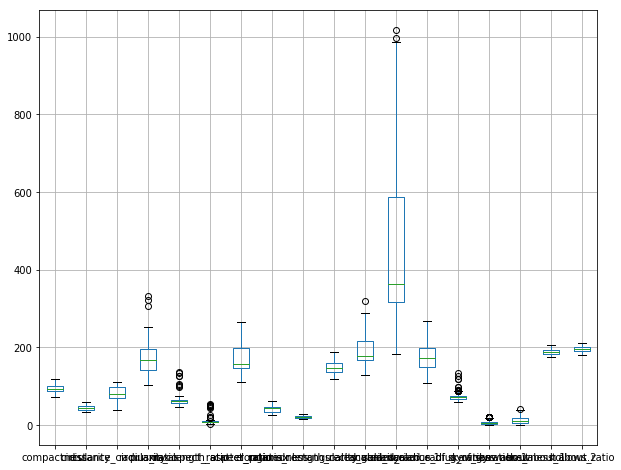

In [53]:
data.boxplot(figsize=[10,8])   

In [54]:
##It looks like we have outliers in 6 columns. we need to treat the outliers first

# Removing Outlier

In [55]:
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = (Q3 - Q1)
print(IQR)

compactness                     13.00
circularity                      9.00
distance_circularity            28.00
radius_ratio                    54.00
pr.axis_aspect_ratio             8.00
max.length_aspect_ratio          3.00
scatter_ratio                   51.00
elongatedness                   13.00
pr.axis_rectangularity           4.00
max.length_rectangularity       22.00
scaled_variance                 50.00
scaled_variance.1              269.00
scaled_radius_of_gyration       49.00
scaled_radius_of_gyration.1      8.00
skewness_about                   7.00
skewness_about.1                14.00
skewness_about.2                 9.00
hollows_ratio                   10.75
dtype: float64


In [56]:
data = data[~((data < (Q1 - 1.5 * IQR)) |(data > (Q3 + 1.5 * IQR))).any(axis=1)]
data.shape

(813, 19)

In [57]:
data

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
5,107,NaN,106.0,172.0,50.0,6,255.0,26.0,28.0,169,280.0,957.0,264.0,85.0,5.0,9.0,181.0,183,bus
6,97,43.0,73.0,173.0,65.0,6,153.0,42.0,19.0,143,176.0,361.0,172.0,66.0,13.0,1.0,200.0,204,bus
7,90,43.0,66.0,157.0,65.0,9,137.0,48.0,18.0,146,162.0,281.0,164.0,67.0,3.0,3.0,193.0,202,van
8,86,34.0,62.0,140.0,61.0,7,122.0,54.0,17.0,127,141.0,223.0,112.0,64.0,2.0,14.0,200.0,208,van
9,93,44.0,98.0,NaN,62.0,11,183.0,36.0,22.0,146,202.0,505.0,152.0,64.0,4.0,14.0,195.0,204,car
10,86,36.0,70.0,143.0,61.0,9,133.0,50.0,18.0,130,153.0,266.0,127.0,66.0,2.0,10.0,194.0,202,van


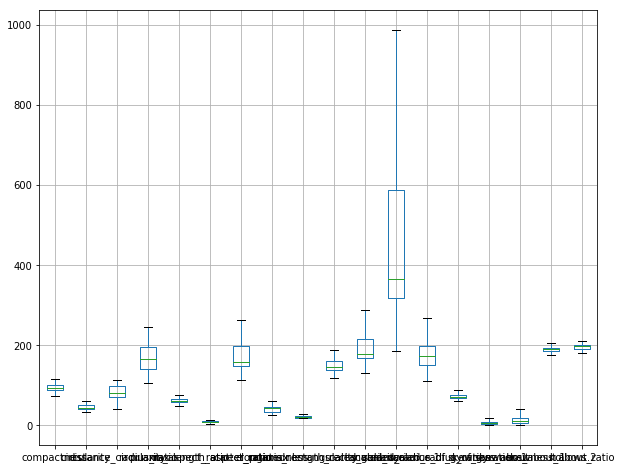

In [58]:
data.boxplot(figsize=[10,8])   ## Below boxplot confirms that the outliers are eliminated from the dataset.

# Treating missing values

In [59]:
##Treating missing values by dropping the rows having Nan

In [70]:
data.dropna(inplace = True)
data

E:\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
6,97,43.0,73.0,173.0,65.0,6,153.0,42.0,19.0,143,176.0,361.0,172.0,66.0,13.0,1.0,200.0,204,bus
7,90,43.0,66.0,157.0,65.0,9,137.0,48.0,18.0,146,162.0,281.0,164.0,67.0,3.0,3.0,193.0,202,van
8,86,34.0,62.0,140.0,61.0,7,122.0,54.0,17.0,127,141.0,223.0,112.0,64.0,2.0,14.0,200.0,208,van
10,86,36.0,70.0,143.0,61.0,9,133.0,50.0,18.0,130,153.0,266.0,127.0,66.0,2.0,10.0,194.0,202,van
11,90,34.0,66.0,136.0,55.0,6,123.0,54.0,17.0,118,148.0,224.0,118.0,65.0,5.0,26.0,196.0,202,car
12,88,46.0,74.0,171.0,68.0,6,152.0,43.0,19.0,148,180.0,349.0,192.0,71.0,5.0,11.0,189.0,195,bus


# 2. Understanding the attributes 

In [71]:
import seaborn as sns

E:\Anaconda\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


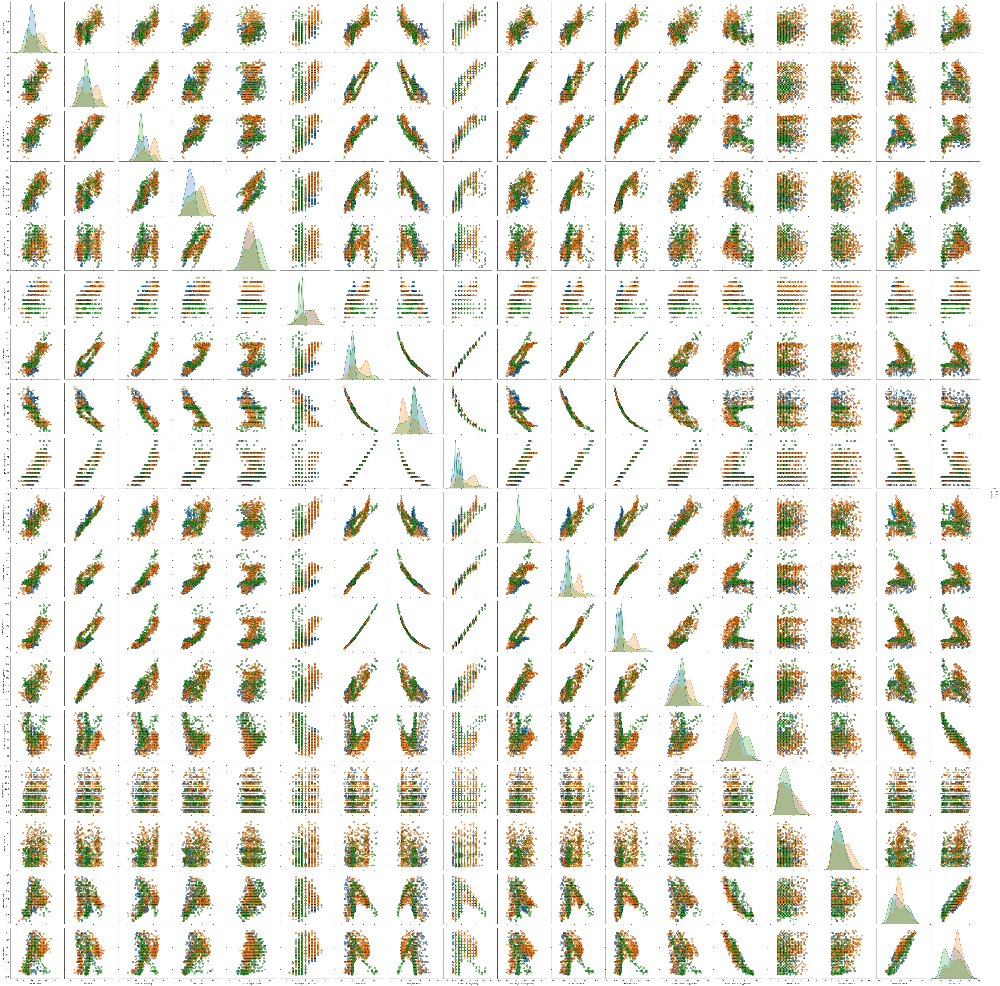

In [72]:
sns.pairplot(data, hue = "class",diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 4)

In [73]:
import matplotlib.pyplot as plt
def correlation_heatmap(data,l,w):
    correlation = data.corr()
    plt.figure(figsize=(l,w))
    sns.heatmap(correlation, vmax=1, square=True,annot=True,cmap='viridis')
    plt.title('Correlation between different fearures')
    plt.show();

In [74]:
df= data.drop('class', axis=1)

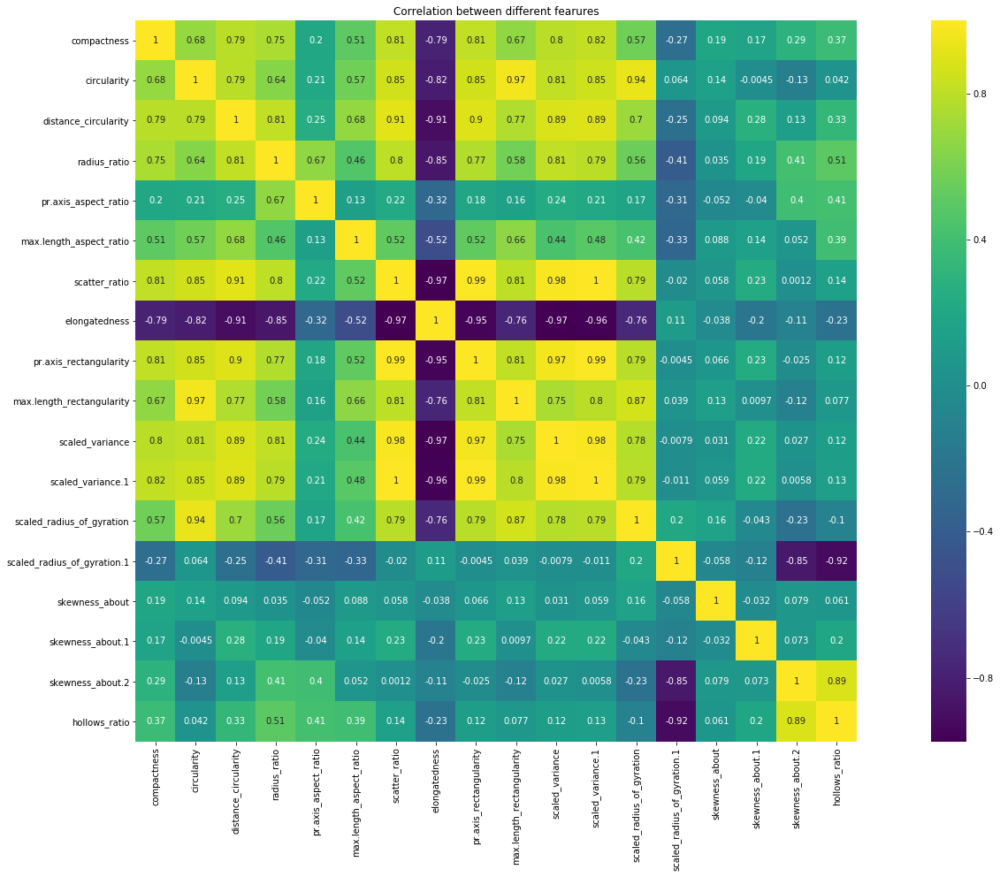

In [75]:
correlation_heatmap(df, 30,15)

#from the heatmap, the ones in light green have strong positive correlation and the ones in dark blue like
#below mentioned columns has strong negative correlation
* skewness_about.2 and scaled_radius_of_gyration.1
* hollows_ratio and scaled_radius_of_gyration.1
* elongatedness has strong negative correlation with most of the columns
#Also it is clear that column skewness_about and skewness_about.1 does not have better correlation and those can
#be eliminated from the dataset

# PCA using sklearnPCA

In [77]:
X=data.iloc[:,0:18]
X.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207
6,97,43.0,73.0,173.0,65.0,6,153.0,42.0,19.0,143,176.0,361.0,172.0,66.0,13.0,1.0,200.0,204


In [80]:
y=data.iloc[:,18]
y.head()

0    van
1    van
2    car
3    van
6    bus
Name: class, dtype: object

In [81]:
from sklearn.preprocessing import StandardScaler
X_std = StandardScaler().fit_transform(X)

E:\Anaconda\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
E:\Anaconda\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


# To find out reduced number of dimention using EIgen vector and Eigen value

In [82]:
u,s,vT = np.linalg.svd(X_std.T)

In [83]:
u

array([[-2.71064737e-01,  8.77380686e-02, -7.36942179e-03,
         1.36273639e-01, -1.28946901e-01,  2.82836016e-01,
         2.03430301e-01,  7.58431123e-01,  3.72779572e-01,
        -1.11539196e-01,  2.73578065e-02, -1.39965122e-02,
         1.74923995e-01, -6.31015009e-02, -5.91275946e-03,
         1.01677650e-04, -3.16351296e-03,  9.05630315e-04],
       [-2.85360050e-01, -1.44846111e-01, -2.11946332e-01,
        -1.11247929e-03,  1.15823363e-01, -5.74343407e-02,
        -3.76422612e-01,  6.61917499e-02,  2.98802808e-02,
         2.14376718e-01,  2.49242922e-02,  5.06616582e-02,
         9.38247939e-02,  2.33131222e-01, -3.14871853e-01,
         6.59105820e-01, -2.06923604e-01,  1.74424905e-02],
       [-3.00814615e-01,  4.13553420e-02,  7.79940438e-02,
         9.67864602e-02,  8.05830855e-02, -3.58425487e-02,
         1.70114790e-01, -3.02117310e-01,  2.91977817e-01,
         8.77472716e-03,  7.72196944e-01, -2.34424130e-01,
        -9.54646418e-02, -1.68405260e-02, -1.24918324e

In [84]:
s

array([87.69632502, 50.99745182, 30.6074144 , 30.00946958, 26.26110966,
       22.42295269, 15.9253512 , 13.3461225 ,  9.28999092,  7.72244332,
        6.76375363,  5.60307797,  4.58575583,  4.06148166,  3.47795817,
        3.05805372,  2.17500417,  0.52506578])

In [85]:
vT

array([[-0.00701834,  0.01723962, -0.0454384 , ..., -0.05950688,
         0.03758353,  0.05713145],
       [ 0.01125056,  0.00613153, -0.00624355, ...,  0.00149472,
         0.02164347, -0.00801489],
       [-0.02169803, -0.00467863, -0.03957732, ..., -0.02303643,
         0.06330654,  0.04358392],
       ...,
       [-0.05868726,  0.02262819,  0.00443086, ...,  0.97600731,
         0.0152986 ,  0.00718885],
       [ 0.03350875, -0.04228239, -0.04674943, ...,  0.01432665,
         0.96623058, -0.02016238],
       [ 0.03709406, -0.03565819, -0.00413698, ...,  0.00595678,
        -0.01849772,  0.97579871]])

# Selecting Principal Components

In [86]:
cov_mat = np.cov(X_std.T)

eig_vals, eig_vecs = np.linalg.eig(cov_mat)

print('Eigenvectors \n%s' %eig_vecs)
print('\nEigenvalues \n%s' %eig_vals)

Eigenvectors 
[[-2.71064737e-01 -8.77380686e-02  1.36273639e-01 -7.36942179e-03
   1.28946901e-01 -2.82836016e-01 -2.03430301e-01  7.58431123e-01
  -3.72779572e-01  1.11539196e-01  2.73578065e-02 -1.39965122e-02
   1.74923995e-01  9.05630315e-04  6.31015009e-02  3.16351296e-03
  -5.91275946e-03 -1.01677650e-04]
 [-2.85360050e-01  1.44846111e-01 -1.11247929e-03 -2.11946332e-01
  -1.15823363e-01  5.74343407e-02  3.76422612e-01  6.61917499e-02
  -2.98802808e-02 -2.14376718e-01  2.49242922e-02  5.06616582e-02
   9.38247939e-02  1.74424905e-02 -2.33131222e-01  2.06923604e-01
  -3.14871853e-01 -6.59105820e-01]
 [-3.00814615e-01 -4.13553420e-02  9.67864602e-02  7.79940438e-02
  -8.05830855e-02  3.58425487e-02 -1.70114790e-01 -3.02117310e-01
  -2.91977817e-01 -8.77472716e-03  7.72196944e-01 -2.34424130e-01
  -9.54646418e-02 -7.45621443e-03  1.68405260e-02 -2.79839814e-02
  -1.24918324e-01  4.41152869e-02]
 [-2.73669313e-01 -1.97617544e-01 -2.56740445e-01  1.84633589e-02
   1.37146112e-01  1.24

In [87]:
eig_vals[0]

9.872458820868621

In [88]:
np.abs(eig_vals[0])

9.872458820868621

In [89]:
eig_vecs[:,0]

array([-0.27106474, -0.28536005, -0.30081461, -0.27366931, -0.1023189 ,
       -0.19897857, -0.3097616 ,  0.3070917 , -0.30689194, -0.27419477,
       -0.3025801 , -0.30723677, -0.25933436,  0.05027689, -0.0345336 ,
       -0.06357812, -0.03562658, -0.08825742])

In [90]:
eig_pairs = (np.abs(eig_vals[0]), eig_vecs[:,2])
eig_pairs

(9.872458820868621,
 array([ 0.13627364, -0.00111248,  0.09678646, -0.25674045, -0.59500507,
         0.3263891 , -0.02052029,  0.08820738,  0.0082207 ,  0.08531622,
        -0.08108656, -0.02586291, -0.05269847, -0.14116644,  0.53712035,
         0.31598546, -0.0252388 ,  0.10538004]))

In [93]:
# Make a list of (eigenvalue, eigenvector) tuples
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]

eig_pairs.sort() #Sorting will give the values from ascending to descending, therefore reversing.
eig_pairs.reverse()

# Visually confirm that the list is correctly sorted by decreasing eigenvalues
print('Eigenvalues in descending order:')
for i in eig_pairs:
    print(i)
    print(i[0])

Eigenvalues in descending order:
(9.872458820868621, array([-0.27106474, -0.28536005, -0.30081461, -0.27366931, -0.1023189 ,
       -0.19897857, -0.3097616 ,  0.3070917 , -0.30689194, -0.27419477,
       -0.3025801 , -0.30723677, -0.25933436,  0.05027689, -0.0345336 ,
       -0.06357812, -0.03562658, -0.08825742]))
9.872458820868621
(3.3385623781931053, array([-0.08773807,  0.14484611, -0.04135534, -0.19761754, -0.2493074 ,
       -0.08327044,  0.07091118, -0.01074581,  0.08398874,  0.13177184,
        0.06703905,  0.07434843,  0.21183624,  0.50500166, -0.01383369,
       -0.08705932, -0.50767731, -0.50643715]))
3.3385623781931053
(1.202585129744323, array([-0.00736942, -0.21194633,  0.07799404,  0.01846336, -0.17472596,
       -0.1247898 ,  0.11219616, -0.08699957,  0.11353372, -0.21865457,
        0.13850811,  0.11503054, -0.22365713,  0.05985447, -0.46663655,
        0.71626856, -0.05892528, -0.0368522 ]))
1.202585129744323
(1.1560568225301264, array([ 0.13627364, -0.00111248,  0.09

In [94]:
tot = sum(eig_vals)
tot

18.02310654685495

In [95]:
sorted(eig_vals, reverse=True)

[9.872458820868621,
 3.3385623781931053,
 1.202585129744323,
 1.1560568225301264,
 0.8852963807334925,
 0.6454285074763215,
 0.32556715113598317,
 0.22865081614587643,
 0.11078810188532928,
 0.07655472499160877,
 0.05872703877952598,
 0.040301004779961604,
 0.026995066145465325,
 0.02117539577566977,
 0.015527847245265623,
 0.012004740124611477,
 0.006072712636346489,
 0.0003539076633170104]

In [97]:
9.872458820868621/tot 

0.547766767910018

In [98]:
3.3385623781931053/tot

0.1852378983342185

In [99]:
1.202585129744323/tot

0.06672463077427544

In [100]:
1.1560568225301264/tot

0.0641430387999265

In [101]:
0.8852963807334925/tot

0.04912007696519874

In [103]:
0.6454285074763215/tot

0.03581116861282437

In [104]:
0.32556715113598317/tot   # First 8 columns giving the 96% of the total value. 

0.01806387540847085

In [110]:
tot = sum(eig_vals)
var_explained = [(i / tot) for i in sorted(eig_vals, reverse=True)]  # an array of variance explained by each 
# eigen vector... there will be 18 entries as there are 18 eigen vectors)
cum_var_exp = np.cumsum(var_explained)  # an array of cumulative variance. There will be 18 entries with 18 th entry 
# cumulative reaching almost 100%
cum_var_exp

array([0.54776677, 0.73300467, 0.7997293 , 0.86387234, 0.91299241,
       0.94880358, 0.96686746, 0.97955399, 0.985701  , 0.98994859,
       0.99320702, 0.99544309, 0.99694089, 0.9981158 , 0.99897735,
       0.99964342, 0.99998036, 1.        ])

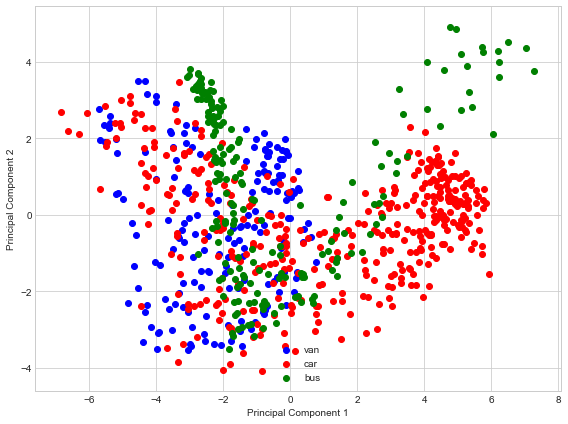

In [140]:
from sklearn.decomposition import PCA as sklearnPCA
sklearn_pca = sklearnPCA(n_components=8)
Y_sklearn = sklearn_pca.fit_transform(X_std)

with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(8, 6))
    for lab, col in zip(('van','car','bus'),
                        ('blue', 'red', 'green')):
        plt.scatter(Y_sklearn[y==lab, 0],
                    Y_sklearn[y==lab, 1],
                    label=lab,
                    c=col)
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend(loc='lower center')
    plt.tight_layout()
    plt.savefig('PREDI3.png', format='png', dpi=1200)
    plt.show()

E:\Anaconda\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning:

The `size` parameter has been renamed to `height`; pleaes update your code.



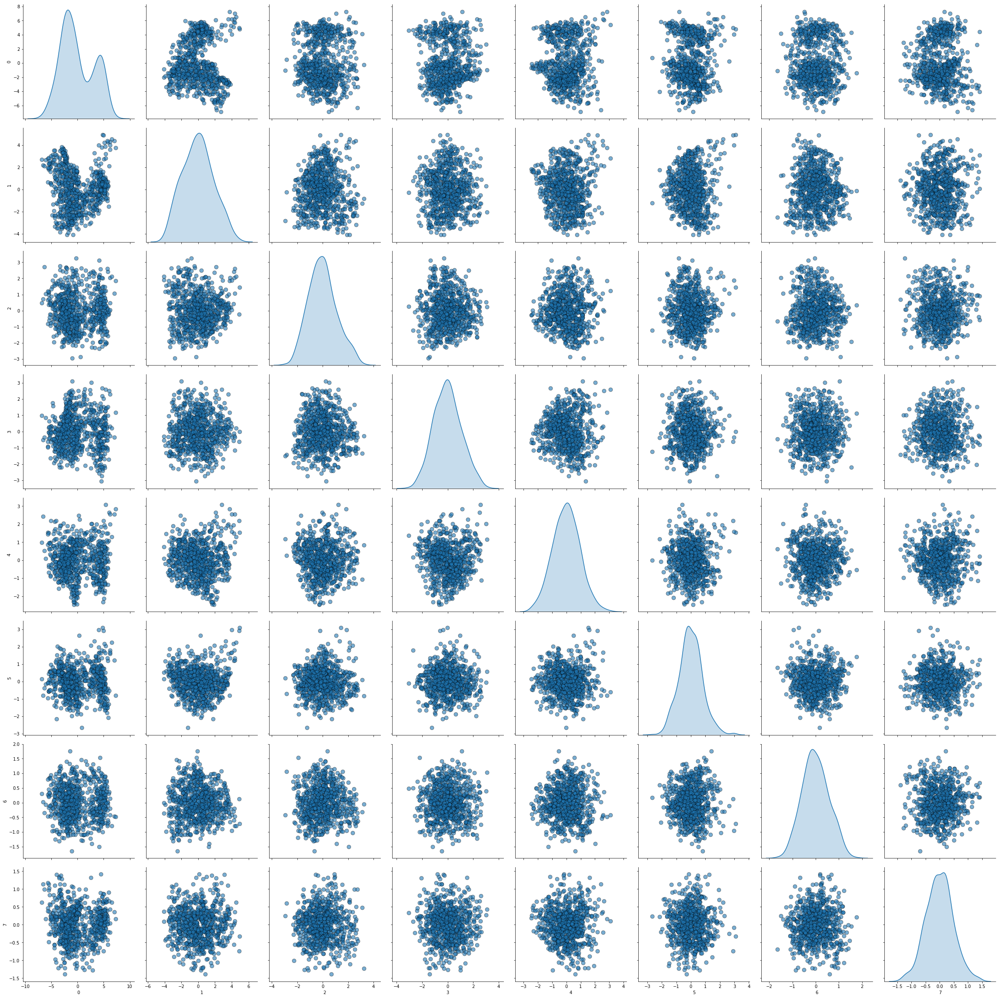

In [141]:
df.to_numpy()
sns.pairplot(df, diag_kind='kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 4)

In [142]:
#the above given plot shows the 7 attributes giving the clear picture of the overall dataset with 19 columns

# Support vector machines

In [143]:
from sklearn.model_selection import train_test_split

#Original data
Orig_X_train,Orig_X_test,Orig_y_train,Orig_y_test = train_test_split(X_std,y,test_size=0.30,random_state=1)

#PCA Data
pca_X_train,pca_X_test,pca_y_train,pca_y_test = train_test_split(Y_sklearn,y,test_size=0.30,random_state=1)


In [144]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score,confusion_matrix, classification_report,roc_auc_score


In [145]:
svc = SVC()  ##Fitting in original data
svc.fit(Orig_X_train,Orig_y_train)

E:\Anaconda\lib\site-packages\sklearn\svm\base.py:196: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.



SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [155]:
#predict the y value
Orig_y_predict = svc.predict(Orig_X_test)

In [161]:
                                            #now fit the model on pca data with new dimension
svc1 = SVC()
svc1.fit(pca_X_train,pca_y_train)

#predict the y value
pca_y_predict = svc1.predict(pca_X_test)
print(classification_report(pca_y_test, pca_y_predict)) 

E:\Anaconda\lib\site-packages\sklearn\svm\base.py:196: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.



              precision    recall  f1-score   support

         bus       0.97      0.95      0.96        62
         car       0.96      0.94      0.95       117
         van       0.90      0.95      0.92        55

   micro avg       0.94      0.94      0.94       234
   macro avg       0.94      0.95      0.94       234
weighted avg       0.95      0.94      0.94       234



In [148]:

print("Model Score On Original Data ",svc.score(Orig_X_test, Orig_y_test))
print("Model Score On Reduced PCA Dimension ",svc1.score(pca_X_test, pca_y_test))

print("Before PCA On Original 18 Dimension",accuracy_score(Orig_y_test,Orig_y_predict))
print("After PCA(On 8 dimension)",accuracy_score(pca_y_test,pca_y_predict))

Model Score On Original Data  0.9529914529914529
Model Score On Reduced PCA Dimension  0.9444444444444444
Before PCA On Original 18 Dimension 0.9529914529914529
After PCA(On 8 dimension) 0.9444444444444444


In [130]:
# with the above result, using 19 columns we are getting the accuracy of 95% and with the reduced dimentionality (i.e) with
#8 columns we are getting accuracy of 94.4%. 

In [156]:
from sklearn.model_selection import GridSearchCV

In [167]:
param_grid = {'C': [0.01, 0.05, 0.5, 1],  
              'kernel': ['rbf']}  
  
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3) 
  
# fitting the model for grid search 
grid.fit(pca_X_train, pca_y_train) 

Fitting 3 folds for each of 4 candidates, totalling 12 fits
[CV] C=0.01, kernel=rbf ..............................................
[CV] ..... C=0.01, kernel=rbf, score=0.5163043478260869, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ..... C=0.01, kernel=rbf, score=0.5193370165745856, total=   0.0s
[CV] C=0.01, kernel=rbf ..............................................
[CV] ..... C=0.01, kernel=rbf, score=0.5193370165745856, total=   0.0s
[CV] C=0.05, kernel=rbf ..............................................
[CV] ..... C=0.05, kernel=rbf, score=0.5163043478260869, total=   0.0s
[CV] C=0.05, kernel=rbf ..............................................
[CV] ..... C=0.05, kernel=rbf, score=0.5193370165745856, total=   0.0s
[CV] C=0.05, kernel=rbf ..............................................
[CV] ..... C=0.05, kernel=rbf, score=0.5248618784530387, total=   0.0s
[CV] C=0.5, kernel=rbf ...............................................
[CV] ...... C=0.5

E:\Anaconda\lib\site-packages\sklearn\model_selection\_split.py:2053: FutureWarning:

You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
E:\Anaconda\lib\site-packages\sklearn\svm\base.py:196: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
E:\Anaconda\lib\site-packages\sklearn\svm\base.py:196: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
E:\Anaconda\lib\site-pac

GridSearchCV(cv='warn', error_score='raise-deprecating',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': [0.01, 0.05, 0.5, 1], 'kernel': ['rbf']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=3)

In [168]:
grid_predictions = grid.predict(pca_X_test) 
  
# print classification report 
print(classification_report(pca_y_test, grid_predictions)) 

              precision    recall  f1-score   support

         bus       0.97      0.95      0.96        62
         car       0.96      0.94      0.95       117
         van       0.90      0.95      0.92        55

   micro avg       0.94      0.94      0.94       234
   macro avg       0.94      0.95      0.94       234
weighted avg       0.95      0.94      0.94       234



In [169]:
param_grid = {'C': [0.01, 0.05, 0.5, 1],  
              'kernel': ['linear']}  
  
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3) 
  
# fitting the model for grid search 
grid.fit(pca_X_train, pca_y_train)

Fitting 3 folds for each of 4 candidates, totalling 12 fits
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.8097826086956522, total=   0.0s
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.8674033149171271, total=   0.0s
[CV] C=0.01, kernel=linear ...........................................
[CV] .. C=0.01, kernel=linear, score=0.8729281767955801, total=   0.0s
[CV] C=0.05, kernel=linear ...........................................
[CV] .. C=0.05, kernel=linear, score=0.8695652173913043, total=   0.0s
[CV] C=0.05, kernel=linear ...........................................
[CV] .. C=0.05, kernel=linear, score=0.8453038674033149, total=   0.0s
[CV] C=0.05, kernel=linear ...........................................
[CV] .. C=0.05, kernel=linear, score=0.9005524861878453, total=   0.0s
[CV] C=0.5, kernel=linear ............................................
[CV] ... C=0.5, k

E:\Anaconda\lib\site-packages\sklearn\model_selection\_split.py:2053: FutureWarning:

You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:    0.0s finished
E:\Anaconda\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning:

The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.



GridSearchCV(cv='warn', error_score='raise-deprecating',
       estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'C': [0.01, 0.05, 0.5, 1], 'kernel': ['linear']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=3)

In [170]:
grid_predictions = grid.predict(pca_X_test) 
  
# print classification report 
print(classification_report(pca_y_test, grid_predictions)) 

              precision    recall  f1-score   support

         bus       0.87      0.85      0.86        62
         car       0.90      0.85      0.88       117
         van       0.84      0.95      0.89        55

   micro avg       0.88      0.88      0.88       234
   macro avg       0.87      0.88      0.88       234
weighted avg       0.88      0.88      0.88       234



In [ ]:
# Prediction using rbf is much more accurate than using linear